# 1. Downloading the ASL Alphabet Dataset from Kaggle


* This cell imports the necessary kagglehub library.

* It then downloads the "ASL Alphabet" dataset from Kaggle.

* A final message is printed to confirm the download is complete.




In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
grassknoted_asl_alphabet_path = kagglehub.dataset_download('grassknoted/asl-alphabet')

print('Data source import complete.')


Using Colab cache for faster access to the 'asl-alphabet' dataset.
Data source import complete.


# 2. Installing the split-folders Library

* This command uses pip, Python's package installer, to add a new library to our environment.




In [ ]:
pip install split-folders

# 3. Importing Libraries and Dependencies

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

import splitfolders

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from keras.models import Sequential
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model

from sklearn.metrics import classification_report, confusion_matrix

# 4. Exploring the Dataset Directory
* This cell inspects the downloaded dataset to understand its file structure.


In [ ]:


# Check what datasets are available
print("Available datasets:")
print(os.listdir('/kaggle/input/'))

# Check the structure of the ASL dataset (it will likely be named 'asl-alphabet')
dataset_path = '/kaggle/input/asl-alphabet/'
print(f"\nContents of {dataset_path}:")
print(os.listdir(dataset_path))

# Check if there are subdirectories
for item in os.listdir(dataset_path):
    item_path = os.path.join(dataset_path, item)
    if os.path.isdir(item_path):
        print(f"\nContents of folder '{item}':")
        print(os.listdir(item_path)[:5])  # Show first 5 items


Available datasets:
['asl-alphabet']

Contents of /kaggle/input/asl-alphabet/:
['asl_alphabet_test', 'asl_alphabet_train']

Contents of folder 'asl_alphabet_test':
['asl_alphabet_test']

Contents of folder 'asl_alphabet_train':
['asl_alphabet_train']


# 5. Defining Paths, Labels, and a Helper Function

* This cell sets up essential variables and a custom function to help organize the data.
  * base_path: A variable is created to hold the full, correct path to the folder containing the training images
  * categories: This dictionary creates a convenient mapping between the numeric labels the model will use (e.g., 0, 1, 2) and their corresponding human-readable class names (e.g., 'A', 'B', 'C').
  * add_class_name_prefix function: This is a helper function designed to modify filenames. Its goal is to prepend a class folder name (like "A/") to each image filename, creating a full path that data generators can use to locate the images.

In [ ]:


# Correct path for the ASL Alphabet dataset
base_path = "/kaggle/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train/"

import pandas as pd

# Use the correct categories dictionary from the actual folder structure
categories = {0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F', 6: 'G', 7: 'H', 8: 'I', 9: 'J', 10: 'K', 11: 'L', 12: 'M', 13: 'N', 14: 'O', 15: 'P', 16: 'Q', 17: 'R', 18: 'S', 19: 'T', 20: 'U', 21: 'V', 22: 'W', 23: 'X', 24: 'Y', 25: 'Z', 26: 'del', 27: 'nothing', 28: 'space'}

def add_class_name_prefix(df, col_name):
    def process_filename(x):
        underscore_match = re.search("_", x)
        if underscore_match:  # Check if underscore exists
            return (x[underscore_match.start() + 1 : underscore_match.start() + 2]
                   + "/" + x)
        else:
            return x  # Return original filename if no underscore found

    df[col_name] = df[col_name].apply(process_filename)
    return df


# 6. Creating a DataFrame from Image Files
* This cell scans the dataset directory to create a structured table (a pandas DataFrame) that links every image file to its correct label.


In [ ]:

# list conatining all the filenames in the dataset
filenames_list = []
# list to store the corresponding category, note that each folder of the dataset has one class of data
categories_list = []

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

# 7. look at the dataframe

In [ ]:
df

,filename,category
0,Q2366.jpg,16
1,W99.jpg,22
2,B2846.jpg,1
3,H2512.jpg,7
4,del33.jpg,26
...,...,...
86995,T1441.jpg,19
86996,T217.jpg,19
86997,T2112.jpg,19
86998,K263.jpg,10


# 8. print the number of samples in the df

In [ ]:
print("number of elements = ", len(df))


number of elements =  87000


# 9. Visualizing a Sample of the Dataset
* 7.This cell's purpose is to display a random sample of 100 images from the dataset to visually confirm that the data has been loaded correctly.

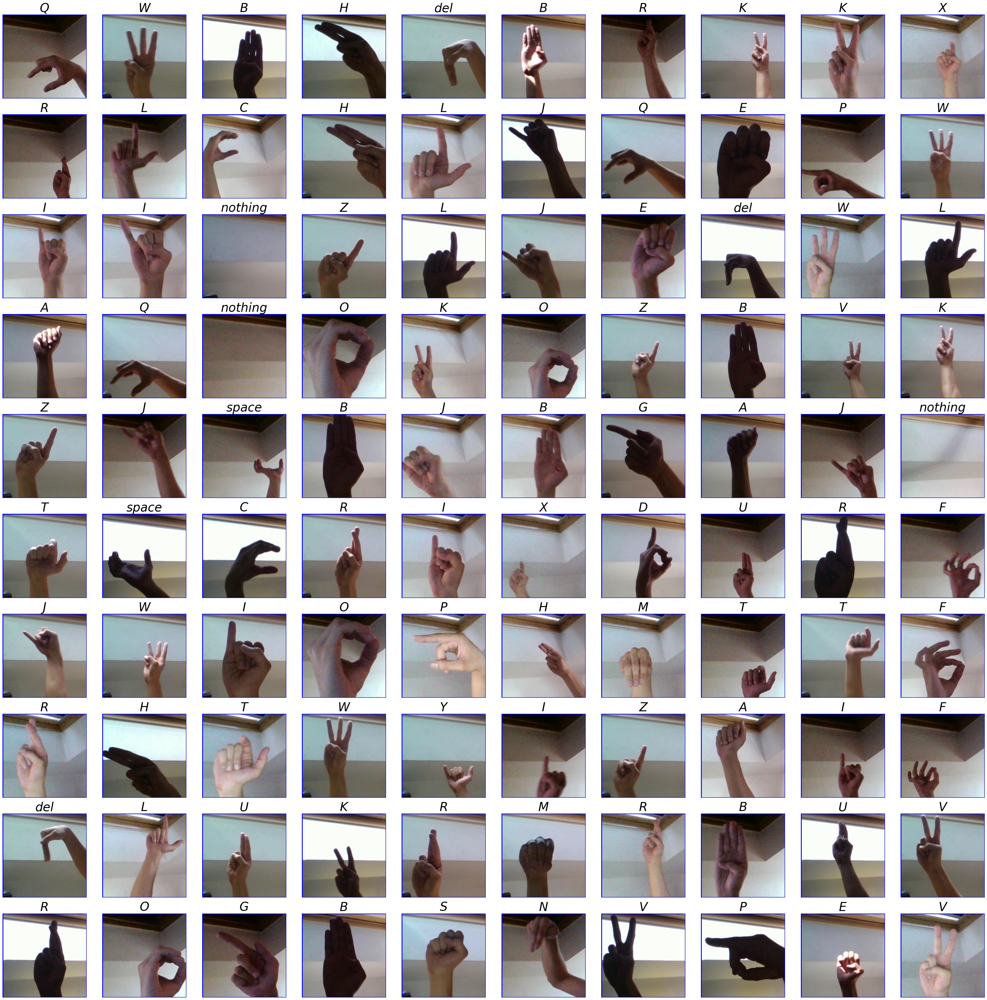

In [ ]:
plt.figure(figsize=(40,40))
for i in range(100):
    # Get the category name and construct the full path
    category_name = categories[df.category[i]]
    filename = df.filename[i]

    # Construct the full path: base_path + folder_name + filename
    path = base_path + category_name + "/" + filename

    img = plt.imread(path)
    plt.subplot(10,10, i + 1)
    plt.imshow(img)
    plt.title(category_name, fontsize=35, fontstyle='italic')
    plt.axis("off")

plt.tight_layout()
plt.show()


# 10. Analyzing Class Distribution
* This cell counts the number of images available for each class (each letter and sign) and creates a bar chart to visualize this information. This is an important step to check if the dataset is balanced.

/tmp/ipython-input-842432032.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=uni,x=uni.index,y='Count',palette='icefire',width=0.4).set_title('Class distribution in Dataset',fontsize=15)


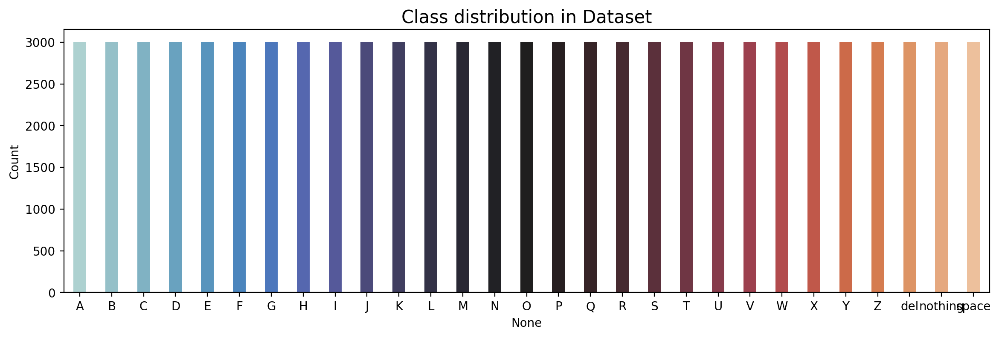

In [ ]:
label,count = np.unique(df.category,return_counts=True)
uni = pd.DataFrame(data=count,index=categories.values(),columns=['Count'])

plt.figure(figsize=(14,4),dpi=200)
sns.barplot(data=uni,x=uni.index,y='Count',palette='icefire',width=0.4).set_title('Class distribution in Dataset',fontsize=15)
plt.show()

# 11. Creating Data Generators
* This cell sets up an efficient data loading pipeline using Keras's ImageDataGenerator. This is a crucial step that allows us to work with a large image dataset without running out of memory, as it loads images in small batches on-demand.



In [ ]:
# Use Keras ImageDataGenerator - loads images on demand
train_dir = "/kaggle/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train/"
test_dir = "/kaggle/input/asl-alphabet/asl_alphabet_test/asl_alphabet_test/"

# Configuration
IMG_SIZE = 200
BATCH_SIZE = 32  # Much smaller batch size for memory efficiency

# Create data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,           # Normalize to [0,1]
    validation_split=0.2      # 20% for validation
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Training generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

# Validation generator
validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
)

# Test generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

print("✅ Data generators created successfully!")
print(f"Training samples: {train_generator.samples}")
print(f"Validation samples: {validation_generator.samples}")
print(f"Test samples: {test_generator.samples}")
print(f"Number of classes: {train_generator.num_classes}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Memory per batch: ~{(BATCH_SIZE * IMG_SIZE * IMG_SIZE * 3 * 4) / (1024**2):.1f} MB")

# Test the generator
sample_batch_x, sample_batch_y = next(train_generator)
print(f"\nSample batch shapes:")
print(f"Images: {sample_batch_x.shape}")
print(f"Labels: {sample_batch_y.shape}")
print(f"Pixel range: [{sample_batch_x.min():.3f}, {sample_batch_x.max():.3f}]")

# Show class mapping
print(f"\nClass indices: {train_generator.class_indices}")


Found 69600 images belonging to 29 classes.
Found 17400 images belonging to 29 classes.
Found 0 images belonging to 0 classes.
✅ Data generators created successfully!
Training samples: 69600
Validation samples: 17400
Test samples: 0
Number of classes: 29
Batch size: 32
Memory per batch: ~14.6 MB

Sample batch shapes:
Images: (32, 200, 200, 3)
Labels: (32, 29)
Pixel range: [0.000, 1.000]

Class indices: {'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16, 'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24, 'Z': 25, 'del': 26, 'nothing': 27, 'space': 28}


# 12. Verifying the Data Generators
* This cell performs a final two-part verification of the train_generator to ensure the data is being loaded and shuffled correctly before we build the model.


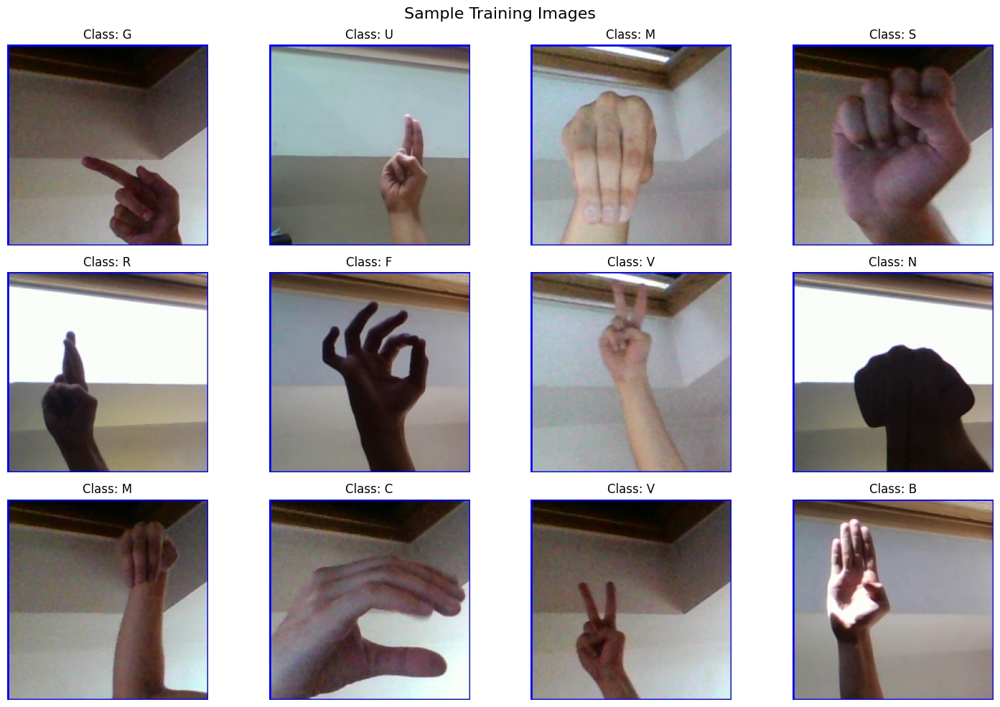

Class distribution check:
Sample distribution (from 10 batches):
A: 13
B: 11
C: 11
D: 17
E: 8
F: 13
G: 7
H: 12
I: 8
J: 13
K: 8
L: 9
M: 11
N: 17
O: 8
P: 9
Q: 17
R: 5
S: 12
T: 12
U: 11
V: 9
W: 5
X: 12
Y: 13
Z: 7
del: 9
nothing: 17
space: 16


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# Visualize sample batch
sample_images, sample_labels = next(train_generator)

plt.figure(figsize=(15, 10))
class_names = list(train_generator.class_indices.keys())

for i in range(12):
    plt.subplot(3, 4, i + 1)
    plt.imshow(sample_images[i])

    # Get class name from one-hot encoded label
    class_idx = np.argmax(sample_labels[i])
    class_name = class_names[class_idx]

    plt.title(f'Class: {class_name}', fontsize=12)
    plt.axis('off')

plt.suptitle('Sample Training Images', fontsize=16)
plt.tight_layout()
plt.show()

# Check class distribution
print("Class distribution check:")
class_counts = {}
for class_name, idx in train_generator.class_indices.items():
    class_counts[class_name] = 0

# Sample a few batches to estimate distribution
for i in range(10):
    batch_x, batch_y = next(train_generator)
    for label in batch_y:
        class_idx = np.argmax(label)
        class_name = class_names[class_idx]
        class_counts[class_name] += 1

print("Sample distribution (from 10 batches):")
for class_name, count in sorted(class_counts.items()):
    print(f"{class_name}: {count}")
